<a href="https://colab.research.google.com/github/JeppeLL/Thesis/blob/master/GAN_interpolate.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Load network + pickle

In [ ]:
network_pkl = 'network-snapshot-006046'
network_path = f'/content/drive/My Drive/Thesis/stylegan2/network_pickles/{network_pkl}.pkl'
psi = 1.0

In [ ]:
import os
import time
import glob
import pickle
import PIL.Image
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

%tensorflow_version 1.x
import tensorflow as tf
print(tf.__version__)
print(tf.test.gpu_device_name())

os.chdir('/content/drive/My Drive/Thesis/stylegan2/')
import dnnlib
import dnnlib.tflib as tflib
import pretrained_networks
print('Loading networks from "%s"...' % network_pkl)
_G, _D, Gs = pretrained_networks.load_networks(network_path)

#Load images
images_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/'
ys = pickle.load(open(images_path+'generated_images.pkl','rb'))
ws = pickle.load(open(images_path+'generated_ws.pkl','rb'))
ws = np.array(ws)[:,0,0] #[N_samples,w_length]

#Load PCA
pca = pickle.load(open('/content/drive/My Drive/Thesis/PCA/pca_original_data_gray.pkl','rb'))

#If the images are already labeled, load list of positive and negative seeds
seeds_positive=pickle.load(open(images_path+'positive_seeds.pkl','rb'))
seeds_negative=pickle.load(open(images_path+'negative_seeds.pkl','rb'))


TensorFlow 1.x selected.
1.15.2
/device:GPU:0
Loading networks from "network-snapshot-006046"...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.


/usr/local/lib/python3.6/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator PCA from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


# Look at images

In [ ]:
def print_images_loop(images,iteration,seeds,rows=30,cols=4,figsize=5):
  cols=cols
  rows=rows
  seed_offset=iteration*cols*rows #If you have already generated x images, and want new seeds, then set seed_offset=x
  print(f"Printing images ({seed_offset};{seed_offset+rows*cols}) out of total {len(seeds)} images.")

  fig,axes=plt.subplots(nrows=rows,ncols=cols,squeeze=False,
                        figsize=(figsize*cols,figsize*rows))
  for row in range(rows):
    for col in range(cols):
      if row*cols+col+seed_offset < len(seeds):
        seed = seeds[row*cols+col+seed_offset]
        axes[row,col].imshow(images[seed])
        axes[row,col].title.set_text(seed)
  plt.tight_layout()
  plt.show()

In [ ]:
print_images_loop(ys,0,list(range(500)))

# define functions

In [ ]:
def generate_images_in_w_space(dlatents, Gs=Gs, truncation_psi=1.0,save=False):
    Gs_kwargs = dnnlib.EasyDict()
    Gs_kwargs.output_transform = dict(func=tflib.convert_images_to_uint8, nchw_to_nhwc=True)
    Gs_kwargs.randomize_noise = False
    Gs_kwargs.truncation_psi = truncation_psi
    #dlatent_avg = Gs.get_var('dlatent_avg') # [component]

    imgs = []
    for i in range(len(dlatents)):
        if i%500==0:
            #clear_output(wait=True)
            print(f"Progress: {i} out of {len(dlatents)}")
        correct_shape = np.tile(dlatents[i],[1,14,1])
        #correct_shape = np.squeeze([np.float32(w_i)],axis=0)
            
        row_images = Gs.components.synthesis.run(correct_shape,  **Gs_kwargs)
        imgs.append(Image.fromarray(row_images[0], 'RGB'))
        #imgs.append(imgs_w_i)
    return imgs

def PCA_pixel_preprocess(images,convert_to_gray=True):
  #Convert from RGB to Grayscale
  if convert_to_gray:
    if images.ndim == 4:
      #print(images.shape)
      #print(f"Images has {images.ndim} dimensions! Converting to grayscale")
      images_temp = []
      for image in images:
        img = Image.fromarray(image).convert('L')
        img = np.asarray(img)
        images_temp.append(img)
      images = np.array(images_temp)
      #print(images.shape)
  else:
    if images.ndim == 4:
      #print(images.shape)
      #print(f"Images has {images.ndim} dimensions! Not converting to grayscale")
      images_temp = []
      for image in images:
        img = np.reshape(image,(-1,256*256*3))
        images_temp.append(img)
      images = np.array(images_temp)
      #print(images.shape)
  #Reshape
  images = np.reshape(images, (len(images), -1))
  #print(images.shape)
  #Normalize
  images = images/255.
  return images

import networkx as nx
def MST(images,ws,pca,seeds):

  images_pca = pca.transform(PCA_pixel_preprocess(images))  
  def distance(a,b):
    assert a.shape == b.shape
    dist_pow2=0
    for i in range(len(a)):
      dist_pow2+=(a[i]-b[i])**2
    dist = np.sqrt(dist_pow2)
    return dist

  Edges = list()
  for i in range(len(images_pca)-1):
    for j in range(i+1,len(images_pca)):
      a=ws[i]
      b=ws[j]
      #a=images_pca[i]
      #b=images_pca[j]
      d = distance(a,b)
      Edges.append([d,i,j])

  Edges = pd.DataFrame(data=Edges,columns=['Weight','Src','Dest'])

  g = nx.Graph()
  for index,row in Edges.iterrows():
    g.add_edge(row['Src'],row['Dest'],weight=row['Weight'])
  MST=list(nx.minimum_spanning_edges(g))

  seed_pairs = list()
  for edge in MST:
    seed_pairs.append([seeds[int(edge[0])],seeds[int(edge[1])]])
  
  return seed_pairs

def interpolate(z0,z1,steps,include_end=False):
  out = list()
  if include_end:
    for index in range(steps):
      fraction = index/float(steps-1)
      out.append(z0*fraction + z1*(1-fraction))
  else:    
    for index in range(steps):
      fraction = index/float(steps)
      out.append(z0*fraction + z1*(1-fraction))
  return out

def get_interpolations(seeds_or_pairs,ws=ws,steps=10):
  interpolations=list()
  if np.array(seeds_or_pairs).ndim==1:
    for i,seed_i in enumerate(seeds_or_pairs):
      for j,seed_j in enumerate(seeds_or_pairs[i:]):
        if seed_i!=seed_j:
          interpolation = interpolate(ws[seed_i],ws[seed_j],steps=steps)
          interpolations.append(interpolation)
  
  if np.array(seeds_or_pairs).ndim==2:
    for i,j in seeds_or_pairs:
      interpolation = interpolate(ws[i],ws[j],steps=steps)
      interpolations.append(interpolation)
  return np.array(interpolations)

def add_noise_to_ws(selected_images_ws,N):
  r = np.random.normal(size=(len(selected_images_ws),N,512))
  selected_images_ws_plus_noise = selected_images_ws[:,np.newaxis]+r
  #selected_images_ws_plus_noise = np.append(selected_images_ws[:,np.newaxis,:],selected_images_ws_plus_noise,axis=1)
  selected_images_ws_plus_noise = selected_images_ws_plus_noise.reshape(-1,512)
  #imgs = generate_images_in_w_space(selected_images_ws_plus_noise)
  return selected_images_ws_plus_noise

def add_var_scaled_noise_to_ws(selected_images_ws,N,w_sd,sd_scaling):
  r = np.random.normal(scale=w_sd*sd_scaling,size=(N,512))
  selected_images_ws_plus_noise = selected_images_ws[:,np.newaxis,:]+r[np.newaxis,:,:]
  #selected_images_ws_plus_noise = np.append(selected_images_ws[:,np.newaxis,:],selected_images_ws_plus_noise,axis=1)
  selected_images_ws_plus_noise = selected_images_ws_plus_noise.reshape(-1,512)
  return selected_images_ws_plus_noise

def run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id):
  np.random.seed(run_id)
  seeds = np.random.choice(seeds,size=seed_subset_size,replace=False)
  print(f"Number of seeds: {len(seeds)}")
  print(f"Number of images to generate with MST: {(len(seeds)-1)*interpolation_steps*max(noise_steps,1)}")
  print(f"Number of images to generate with all combinations: {len(seeds)*(len(seeds)-1)/2*interpolation_steps*max(noise_steps,1)}")

  save_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/interpolations_{image_type}_{interpolation_steps}_{noise_steps}_{run_id}.pkl'

  if pair_selection_method=='MST':
    pairs=MST(ys[seeds],ws[seeds],pca,seeds)
  if pair_selection_method=='all combinations':
    pairs=list()
    for i in range(len(seeds)-1):
      for j in range(i+1,len(seeds)):
        pairs.append([seeds[i],seeds[j]])
  print(pairs)
  interpolations = get_interpolations(pairs,steps=interpolation_steps)
  interpolations = np.reshape(interpolations,(-1,512))
  #print(interpolations.shape)
  if noise_steps>0:  
    if noise_scaling == 'w_std':
      interpolations = add_var_scaled_noise_to_ws(interpolations,
                                                  noise_steps,
                                                  np.std(ws,axis=0),
                                                  noise_scaling_factor)
    if noise_scaling == 'no':
      interpolations = add_noise_to_ws(interpolations,noise_steps)

  print(interpolations.shape)

  results = generate_images_in_w_space(interpolations)

  #Save results
  print('Saving to path:')
  print(save_path)
  pickle.dump(results,open(save_path,'wb'))

  return interpolations,results


# Define seeds of interest

In [ ]:
#network instance 006046:
seeds_positive=pickle.load(open(images_path+'positive_seeds.pkl','rb'))
seeds_negative=pickle.load(open(images_path+'negative_seeds.pkl','rb'))

few_on_edge = [94, 867, 852, 855, 804, 791, 781, 748, 73, 724, 67, 684, 647, 620, 591, 570, 565, 549, 536, 540, 53, 490, 493, 47, 470, 443, 440, 412, 398, 366, 377, 347, 350, 333, 321, 323, 30, 297, 298, 299, 288, 275, 271, 246, 218, 226, 163, 161, 141, 135, 134, 131, 122, 108, 0, 102]
many_small_transparent = [899, 89, 882, 873, 859, 850, 814, 800, 785, 78, 765, 730, 731, 718, 700, 696, 705, 658, 668, 654, 646, 639, 615, 610, 602, 603, 593, 592, 571, 543, 518, 497, 508, 491, 494, 475, 46, 468, 431, 41, 397, 352, 345, 344, 334, 31, 315, 316, 295, 292, 289, 268, 260, 234, 245, 182, 187, 174, 151, 153, 126, 111, 104, 114]
tiny_noise = [876, 857, 828, 840, 821, 8, 766, 738, 740, 714, 717, 664, 655, 656, 643, 623, 618, 61, 575, 577, 564, 567, 560, 551, 538, 482, 472, 466, 458, 417, 411, 380, 356, 338, 328, 3, 208, 210, 203, 175, 179, 178, 164, 176, 144, 138, 13, 110]
empty = seeds_negative



In [ ]:
#network instance 011368
few_on_edge = [176,141,122,104,105,108,94,73,53,47,44,0,29,30]
many_small_transparent = [174,152,153,151,126,130,111,114,99,78,83,41]
tiny_noise = [273,308,324,179,170,154,144,45,62,135]
empty = [55,32,33,34,2,3,6,4,8,9,15,19,21,25,27]

# Generate N synthetic images - small N

In [ ]:
#Look at images to be sure
rows=5
cols=2
print_images_loop(ys,0,sorted(few_on_edge),rows=rows,cols=cols)
print_images_loop(ys,0,sorted(many_small_transparent),rows=rows,cols=cols)
print_images_loop(ys,0,sorted(tiny_noise),rows=rows,cols=cols)
print_images_loop(ys,0,sorted(empty),rows=rows,cols=cols)

In [ ]:
#network instance 006046
few_on_edge_N10 = [0,39,47,53,67,73,122,131,163,226]
many_small_transparent_N10 = [31,41,46,78,104,126,153,174,182,260]
tiny_noise_N10 = [3,13,164,110,144,178,176,203,210,338]
empty_N10 = [4,19,27,29,33,42,48,86,77,87]

#network instance 011368
#few_on_edge_N10 = sorted(few_on_edge)[:10]
#many_small_transparent_N10 = sorted(many_small_transparent)[:10]
#tiny_noise_N10 = sorted(tiny_noise)[:10]
#empty_N10 = sorted(empty)[:10]

## Generate

In [ ]:
few_on_edge_names = [f"few_on_edge_{seed}" for seed in few_on_edge_N10]
many_small_transparent_names = [f"many_small_transparent_{seed}" for seed in many_small_transparent_N10]
tiny_noise_names = [f"tiny_noise_{seed}" for seed in tiny_noise_N10]
empty_names = [f"empty_{seed}" for seed in empty_N10]

In [ ]:
os.mkdir(f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/N10/')

In [ ]:
#few on edge N10
for name,image in zip(few_on_edge_names,ys[few_on_edge_N10]):
  save_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/N10/{name}.png'
  img = PIL.Image.fromarray(image)
  img.save(open(save_path,'wb'))

#many_small_transparent_N10
for name,image in zip(many_small_transparent_names,ys[many_small_transparent_N10]):
  save_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/N10/{name}.png'
  img = PIL.Image.fromarray(image)
  img.save(open(save_path,'wb'))

#tiny_noise_N10
for name,image in zip(tiny_noise_names,ys[tiny_noise_N10]):
  save_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/N10/{name}.png'
  img = PIL.Image.fromarray(image)
  img.save(open(save_path,'wb'))

#empty_N10
for name,image in zip(empty_names,ys[empty_N10]):
  save_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/N10/{name}.png'
  img = PIL.Image.fromarray(image)
  img.save(open(save_path,'wb'))


# Generate N synthetic images - large N

# Few on edge

## Investigate how much noise we should add
- we want to keep the class and type the same
- we want to have some variance on the images

In [ ]:
# test 1 - few on edge, sd_scaling = 1
seeds = few_on_edge_N10
seed_subset_size = 10
pair_selection_method = 'MST' #'all combinations' or 'MST'
interpolation_steps = 6
noise_scaling = 'w_std' #options: 'no', 'w_std'
noise_steps = 1 #choose int for how many copies with random noise you want. Choose 0 if you dont want any noise added
image_type = 'few_on_edge'
run_id = 0 #Random seed

#Run
noise_scaling_factor = 1
_,results_scale1 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
noise_scaling_factor = 0.5
_,results_scale05 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
noise_scaling_factor = 0.2
_,results_scale02 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
#Run with no scaling
noise_steps = 0
_,results_noscale = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)

Number of seeds: 10
Number of images to generate with MST: 54
Number of images to generate with all combinations: 270.0
[[122, 0], [67, 53], [122, 73], [53, 0], [39, 73], [226, 0], [163, 53], [47, 67], [131, 0]]
(54, 512)
Progress: 0 out of 54
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1.0/interpolations_few_on_edge_6_1_0.pkl
Number of seeds: 10
Number of images to generate with MST: 54
Number of images to generate with all combinations: 270.0
[[122, 0], [67, 53], [122, 73], [53, 0], [39, 73], [226, 0], [163, 53], [47, 67], [131, 0]]
(54, 512)
Progress: 0 out of 54
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1.0/interpolations_few_on_edge_6_1_0.pkl
Number of seeds: 10
Number of images to generate with MST: 54
Number of images to generate with all combinations: 270.0
[[122, 0], [67, 53], [122, 73], [53, 0], [39, 73], [226, 0], [163, 53], [47, 67], [131, 0]]
(54, 512)
Progress: 

In [ ]:
rows = len(results_noscale)
fig,axes = plt.subplots(ncols=4,nrows=rows,sharey=True,figsize=(5*4,5*rows)) #54
for i in range(rows):
  axes[i,0].imshow(results_noscale[i])
  axes[i,1].imshow(results_scale02[i])
  axes[i,2].imshow(results_scale05[i])
  axes[i,3].imshow(results_scale1[i])
plt.show()
  

## Generate

Okay, we take a scaling factor of 0.2, as it 0.5 and 1 seems to show some of the time changing the class

In [ ]:
len(few_on_edge)

56

In [ ]:
print(f"Number of images to generate with MST: {(49)*5*max(2,1)}")

Number of images to generate with MST: 490


In [ ]:
seeds = few_on_edge_N10
seed_subset_size = 10
pair_selection_method = 'MST' #'all combinations' or 'MST'
interpolation_steps = 8
noise_scaling = 'w_std' #options: 'no', 'w_std'
noise_scaling_factor = 0.2
noise_steps = 2 #choose int for how many copies with random noise you want. Choose 0 if you dont want any noise added
image_type = 'few_on_edge'
run_id = 0 #Random seed

#Run
interpolations,results = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
  

Number of seeds: 10
Number of images to generate with MST: 144
Number of images to generate with all combinations: 720.0
[[122, 0], [67, 53], [122, 73], [53, 0], [39, 73], [226, 0], [163, 53], [47, 67], [131, 0]]
(144, 512)
Progress: 0 out of 144
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1.0/interpolations_few_on_edge_8_2_0.pkl


In [ ]:
#Print results to double check
rows = (seed_subset_size-1)*max(noise_steps,1)
cols = interpolation_steps
fig,axes = plt.subplots(ncols=cols,nrows=rows,sharey=True,figsize=(5*cols,5*rows)) #54
for i in range(rows):
  for j in range(cols):
    axes[i,j].imshow(results[i*cols+j])
    axes[i,j].set_xticks([])
    axes[i,j].set_yticks([])
    axes[i,j].title.set_text(i*cols+j)
plt.tight_layout()
plt.show()

In [ ]:
#Manual inspection shows the following images to not be good enough
removals=[79,78,77,76,134,135,136,137,138,139,140,141,142,143]
idx = list(set(range(len(results)))-set(removals))
print(len(idx))
#print(idx)
np.random.seed(hash('few_on_edge_N100')%(2**31))
idx = np.random.choice(idx,size=100,replace=False)
print(idx)

130
[ 67  22  97  69 125 129  32  85  73  88  63  45   1  90  31  39  60  84
  99  74 110 112  95 123  25  61   7  23  55  36   2  98 103  92  17 109
  34 128  30 132  47  20  29  27  49  56 115  72 127  26  66  70  38 101
 105 118  18  59  94 104  11  21  64 122  46  81  28  48  96 130  58  57
  65  13 102 100 106 120   9   6  87  62 121  43  16 119  41 113 133  44
  51  37 126 117  52  68  19  93 131  80]


In [ ]:
os.mkdir(f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/N150')

In [ ]:
#Save few_on_edge_N50
for i in idx:
  save_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/N150/few_on_edge_{i}.png'
  results[i].save(open(save_path,'wb'))

# Many small transparent

## How much noise

In [ ]:
seeds = many_small_transparent
seed_subset_size = 10
pair_selection_method = 'MST' #'all combinations' or 'MST'
interpolation_steps = 6
noise_scaling = 'w_std' #options: 'no', 'w_std'
noise_scaling_factor = 1
noise_steps = 1 #choose int for how many copies with random noise you want. Choose 0 if you dont want any noise added
image_type = 'many_small_transparent'
run_id = 0 #Random seed

#Run
noise_scaling_factor = 1
_,results_scale1 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
noise_scaling_factor = 0.5
_,results_scale05 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
noise_scaling_factor = 0.2
_,results_scale02 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
#Run with no scaling
noise_steps = 0
_,results_noscale = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)

Number of seeds: 10
Number of images to generate with MST: 54
Number of images to generate with all combinations: 270.0
[[497, 104], [494, 491], [31, 344], [494, 104], [593, 104], [543, 491], [31, 104], [111, 104], [397, 593]]
(54, 512)
Progress: 0 out of 54
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1.0/interpolations_many_small_transparent_6_1_0.pkl
Number of seeds: 10
Number of images to generate with MST: 54
Number of images to generate with all combinations: 270.0
[[497, 104], [494, 491], [31, 344], [494, 104], [593, 104], [543, 491], [31, 104], [111, 104], [397, 593]]
(54, 512)
Progress: 0 out of 54
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1.0/interpolations_many_small_transparent_6_1_0.pkl
Number of seeds: 10
Number of images to generate with MST: 54
Number of images to generate with all combinations: 270.0
[[497, 104], [494, 491], [31, 344], [494, 104], [593, 104], 

In [ ]:
fig,axes = plt.subplots(ncols=4,nrows=54,sharey=True,figsize=(5*4,5*54)) #54
for i in range(len(results_noscale)):
  axes[i,0].imshow(results_noscale[i])
  axes[i,1].imshow(results_scale02[i])
  axes[i,2].imshow(results_scale05[i])
  axes[i,3].imshow(results_scale1[i])
plt.show()
  

For this one, we dont want much noise, as it seems to increase the intensity of the bacteria colonies. So 0.2

## Generate

In [ ]:
seeds = many_small_transparent_N10
seed_subset_size = 10
pair_selection_method = 'MST' #'all combinations' or 'MST'
interpolation_steps = 8
noise_scaling = 'w_std' #options: 'no', 'w_std'
noise_scaling_factor = 0.2
noise_steps = 2 #choose int for how many copies with random noise you want. Choose 0 if you dont want any noise added
image_type = 'many_small_transparent'
run_id = 1 #Random seed

interpolations,results = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)


Number of seeds: 10
Number of images to generate with MST: 144
Number of images to generate with all combinations: 720.0
[[46, 41], [174, 126], [104, 126], [31, 174], [104, 78], [260, 174], [260, 182], [46, 174], [260, 153]]
(144, 512)
Progress: 0 out of 144
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1.0/interpolations_many_small_transparent_8_2_1.pkl


In [ ]:
#Print results to double check
rows = (seed_subset_size-1)*max(noise_steps,1)
cols = interpolation_steps
fig,axes = plt.subplots(ncols=cols,nrows=rows,sharey=True,figsize=(5*cols,5*rows)) #54
for i in range(rows):
  for j in range(cols):
    axes[i,j].imshow(results[i*cols+j])
    axes[i,j].set_xticks([])
    axes[i,j].set_yticks([])
    axes[i,j].title.set_text(i*cols+j)
plt.tight_layout()
plt.show()

In [ ]:
len([143,141,139,137,136,128,130,132,134,112,114,95,96,97,99,101,93,91,89,48,50])

21

In [ ]:
#Manual inspection shows the following images to not be good enough
removals=[143,141,139,137,136,128,130,132,134,112,114,95,96,97,99,101,93,91,89,48,50,116]
idx = list(set(range(len(results)))-set(removals))
print(len(idx))
#print(idx)
np.random.seed(hash('many_small_transparent_N150')%(2**31))
idx = np.random.choice(idx,size=100,replace=False)
print(idx)

122
[  4  25  38  39  63  33  69  11  30  51  17  34  10 111  62  42  60  52
   7  22   3  32  20 103 123 131  64  59  36  56  72  43  85  16  65  14
   0  79  37 105  92  18 142  31  68  86 122  44 124 121  55 107  84 104
   1 133  26  71  58  57 109 140 117 120  19  53 100   6  78 118  80  47
   2  76  98  13 119 102  90  73  54  66 125 106  82  88  49  83 110  46
  87  45  29   5   8  67  94  40  28  35]


In [ ]:
#Save many_small_transparent_N50
for i in idx:
  save_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/N150/many_small_transparent_{i}.png'
  results[i].save(open(save_path,'wb'))

# Tiny/Noise

## How much noise

In [ ]:
seeds = tiny_noise
seed_subset_size = 10
pair_selection_method = 'MST' #'all combinations' or 'MST'
interpolation_steps = 6
noise_scaling = 'w_std' #options: 'no', 'w_std'
noise_steps = 1 #choose int for how many copies with random noise you want. Choose 0 if you dont want any noise added
image_type = 'many_small_transparent'
run_id = 2 #Random seed

#Run
noise_scaling_factor = 1
_,results_scale1 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
noise_scaling_factor = 0.5
_,results_scale05 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
noise_scaling_factor = 0.2
_,results_scale02 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
#Run with no scaling
noise_steps = 0
_,results_noscale = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)

Number of seeds: 10
Number of images to generate with MST: 54
Number of images to generate with all combinations: 270.0
[[164, 618], [655, 13], [618, 656], [618, 176], [655, 3], [551, 13], [13, 643], [3, 176], [551, 876]]
(54, 512)
Progress: 0 out of 54
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1.0/interpolations_many_small_transparent_6_1_2.pkl
Number of seeds: 10
Number of images to generate with MST: 54
Number of images to generate with all combinations: 270.0
[[164, 618], [655, 13], [618, 656], [618, 176], [655, 3], [551, 13], [13, 643], [3, 176], [551, 876]]
(54, 512)
Progress: 0 out of 54
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1.0/interpolations_many_small_transparent_6_1_2.pkl
Number of seeds: 10
Number of images to generate with MST: 54
Number of images to generate with all combinations: 270.0
[[164, 618], [655, 13], [618, 656], [618, 176], [655, 3], [551, 13], [

In [ ]:
fig,axes = plt.subplots(ncols=4,nrows=54,sharey=True,figsize=(5*4,5*54)) #54
for i in range(len(results_noscale)):
  axes[i,0].imshow(results_noscale[i])
  axes[i,1].imshow(results_scale02[i])
  axes[i,2].imshow(results_scale05[i])
  axes[i,3].imshow(results_scale1[i])
plt.show()
  

## Generate

In [ ]:
seeds = tiny_noise_N10
seed_subset_size = 10 #min(len(seeds),50)
pair_selection_method = 'MST' #'all combinations' or 'MST'
interpolation_steps = 8
noise_scaling = 'w_std' #options: 'no', 'w_std'
noise_scaling_factor = 0.5
noise_steps = 2 #choose int for how many copies with random noise you want. Choose 0 if you dont want any noise added
image_type = 'tiny_noise'
run_id = 2 #Random seed

interpolations,results = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)


Number of seeds: 10
Number of images to generate with MST: 144
Number of images to generate with all combinations: 720.0
[[176, 210], [203, 176], [203, 110], [110, 338], [144, 210], [144, 13], [178, 110], [178, 164], [144, 3]]
(144, 512)
Progress: 0 out of 144
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1.0/interpolations_tiny_noise_8_2_2.pkl


In [ ]:
#Print results to double check
rows = (seed_subset_size-1)*max(noise_steps,1)*2
cols = interpolation_steps//2
fig,axes = plt.subplots(ncols=cols,nrows=rows,sharey=True,figsize=(5*cols,5*rows)) #54
for i in range(rows):
  for j in range(cols):
    axes[i,j].imshow(results[i*cols+j])
    axes[i,j].set_xticks([])
    axes[i,j].set_yticks([])
    axes[i,j].title.set_text(i*cols+j)
plt.tight_layout()
plt.show()

In [ ]:
#Manual inspection shows the following images to not be good enough
removals=[11,17,19,23,21,65,67,68,69,81,83,87,85,88,89,111,109,112,113,114,115,116,117,118,119,121,122,123,124,125,127,128,129,130,131,132,133,134,135,139,137,140,141,143]
idx = list(set(range(len(results)))-set(removals))
print(len(idx))
#print(idx)

np.random.seed(hash('tiny_noise_N150')%(2**31))
idx = np.random.choice(idx,size=100,replace=False)
print(idx)


100
[101  51   0   9  56   6  82  57  54  96   3 136  41 120  40  55  58  35
  93 104  39  71 110  16  15   2  25  60  43  12  45  47  79  66  28  26
   7  14  31  62  37  18  49 126  91  34  70   1  29  99  42  74  44  98
  80 100  72  97 102  10  48  95  52  24  63  76 106  94  77  61 103 105
 142  64  53   5  13  86  84  33  46  59  36  73  78   4  50  90  92  75
 108  22   8  32  20  30 107 138  27  38]


In [ ]:
a=np.random.normal(loc=0,scale=[1,2,3,100],size=4)
print(a)

[  0.66787675  -0.9216376   -0.8710384  -16.3958981 ]


In [ ]:
#Save tiny_noise_N50
for i in idx:
  save_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/N150/tiny_noise_{i}.png'
  results[i].save(open(save_path,'wb'))

# Empty

## How much noise

In [ ]:
len(seeds_negative)

223

In [ ]:
seeds = seeds_negative
seed_subset_size = 20
pair_selection_method = 'MST' #'all combinations' or 'MST'
interpolation_steps = 3
noise_scaling = 'w_std' #options: 'no', 'w_std'
noise_steps = 1 #choose int for how many copies with random noise you want. Choose 0 if you dont want any noise added
image_type = 'empty'
run_id = 3 #Random seed

#Run
noise_scaling_factor = 1
_,results_scale1 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
noise_scaling_factor = 0.5
_,results_scale05 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
noise_scaling_factor = 0.2
_,results_scale02 = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)
#Run with no scaling
noise_steps = 0
_,results_noscale = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)

Number of seeds: 20
Number of images to generate with MST: 57
Number of images to generate with all combinations: 570.0
[[666, 1386], [269, 666], [666, 301], [587, 455], [1320, 158], [455, 818], [695, 91], [587, 301], [81, 91], [695, 301], [695, 965], [695, 1320], [1186, 301], [252, 158], [695, 561], [561, 385], [252, 1289], [666, 712], [269, 863]]
(57, 512)
Progress: 0 out of 57
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1.0/interpolations_empty_3_1_3.pkl
Number of seeds: 20
Number of images to generate with MST: 57
Number of images to generate with all combinations: 570.0
[[666, 1386], [269, 666], [666, 301], [587, 455], [1320, 158], [455, 818], [695, 91], [587, 301], [81, 91], [695, 301], [695, 965], [695, 1320], [1186, 301], [252, 158], [695, 561], [561, 385], [252, 1289], [666, 712], [269, 863]]
(57, 512)
Progress: 0 out of 57
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1

In [ ]:
fig,axes = plt.subplots(ncols=4,nrows=54,sharey=True,figsize=(5*4,5*54)) #54
for i in range(54):
  axes[i,0].imshow(results_noscale[i])
  axes[i,1].imshow(results_scale02[i])
  axes[i,2].imshow(results_scale05[i])
  axes[i,3].imshow(results_scale1[i])
plt.show()
  

## Generate

As for scaling the randomness, we see that a scale=1 sometimes leads to positive images. 0.5 does not, so we pick this.

In [ ]:
seeds = empty_N10
seed_subset_size = 10
pair_selection_method = 'MST' #'all combinations' or 'MST'
interpolation_steps = 8
noise_scaling = 'w_std' #options: 'no', 'w_std'
noise_scaling_factor = 0.5
noise_steps = 2 #choose int for how many copies with random noise you want. Choose 0 if you dont want any noise added
image_type = 'empty'
run_id = 3 #Random seed

#Run
_,results = run(ys,ws,seeds,pca,pair_selection_method,interpolation_steps,noise_scaling,noise_scaling_factor,noise_steps,seed_subset_size,image_type,run_id)


Number of seeds: 10
Number of images to generate with MST: 144
Number of images to generate with all combinations: 720.0
[[27, 4], [4, 29], [48, 77], [48, 86], [33, 77], [87, 29], [86, 4], [42, 33], [19, 4]]
(144, 512)
Progress: 0 out of 144
Saving to path:
/content/drive/My Drive/Thesis/generated_images/network-snapshot-006046/truncation_1.0/interpolations_empty_8_2_3.pkl


In [ ]:
#Print results to double check
rows = (seed_subset_size-1)*max(noise_steps,1)*2
cols = interpolation_steps//2
fig,axes = plt.subplots(ncols=cols,nrows=rows,sharey=True,figsize=(5*cols,5*rows)) #54
for i in range(rows):
  for j in range(cols):
    axes[i,j].imshow(results[i*cols+j])
    axes[i,j].set_xticks([])
    axes[i,j].set_yticks([])
    axes[i,j].title.set_text(i*cols+j)
plt.tight_layout()
plt.show()

In [ ]:
#Manual inspection shows the following images to not be good enough
removals=[0,1,2,3,4,11,15,13,26,28,30,31,35,33,32,46,54,53,56,62,64,73,74,86,89,96,97,99,103,102,104,105,106,107,109,108,111,122,120,127,131,129,128,141]
idx = list(set(range(len(results)))-set(removals))
print(len(idx))
#print(idx)
np.random.seed(hash('empty_N150')%(2**31))
idx = np.random.choice(idx,size=100,replace=False)
print(idx)


100
[126 139 134  71   7   8  87 112 138  63  69  79  59  38 130 119  67  42
 115  61  65  22  21  60 135  20 123  81  95  49  77 142  44  10  70 136
 113  37 101   9  66  23   5  16  84  92  93  88  34  48  45 117  91  90
  51 110  47  40  36 100 121 132  76  68  55  17 114  82  50 118  43  25
 143  41  75  52 137  57 140  14  80 116  58  24  98  29   6  83  94  19
 133  39  27  78 125  85 124  12  18  72]


In [ ]:
#Save empty_N50
for i in idx:
  save_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/N150/empty_{i}.png'
  results[i].save(open(save_path,'wb'))

# Compare interpolation quality of model instances

In [ ]:
def explore_interpolations(seeds,ws,Gs,save_fig=False):
  ws_of_interest = list()
  for seed in seeds:
    ws_of_interest.append(ws[int(seed)])
  interpolations = list()
  pairs = list()
  for i in range(len(seeds)-1):
    for j in range(i+1,len(seeds)):
      pairs.append(seeds[i]+'_'+seeds[j])
      interpolations.append(interpolate(ws_of_interest[i],ws_of_interest[j],10,include_end=True))
  interpolations = np.array(interpolations).reshape(-1,512)
  print(interpolations.shape)
  results = generate_images_in_w_space(interpolations,Gs=Gs)

  n_pairs=len(seeds)*(len(seeds)-1)//2
  cols=len(results)//n_pairs
  fig,axes = plt.subplots(ncols=cols,nrows=n_pairs,figsize=(4*cols,4*n_pairs),squeeze=False)
  for idx,ax in enumerate(axes.flat):
    ax.imshow(results[idx])
    ax.set_xticks([])
    ax.set_yticks([])
  #for i in range(len(pairs)):
  #  axes[i,0].set_ylabel(pairs[i])
  plt.tight_layout()
  if save_fig:
    plt.savefig(open(save_fig,'wb'))
  plt.show()

## pickle 006046
- load pickle
- load ws with rare features
- interpolate

In [ ]:
network_pkl = 'network-snapshot-006046'
network_path = f'/content/drive/My Drive/Thesis/stylegan2/network_pickles/{network_pkl}.pkl'
psi = 1.0

#Seeds of interest
udsmurt = ['C:/Users/lauri/Desktop/rare features generation/006046/image-75.jpg',
           'C:/Users/lauri/Desktop/rare features generation/006046/image-979.jpg',
           'C:/Users/lauri/Desktop/rare features generation/006046/image-343.jpg']

farver = ['C:/Users/lauri/Desktop/rare features generation/006046/image-1089.jpg',
          'C:/Users/lauri/Desktop/rare features generation/006046/image-133.jpg',
          'C:/Users/lauri/Desktop/rare features generation/006046/image-627.jpg']


store = ['C:/Users/lauri/Desktop/rare features generation/006046/image-940.jpg',
         'C:/Users/lauri/Desktop/rare features generation/006046/image-559.jpg',
         'C:/Users/lauri/Desktop/rare features generation/006046/image-253.jpg']

labels = ['C:/Users/lauri/Desktop/rare features generation/006046/image-177.jpg',
          'C:/Users/lauri/Desktop/rare features generation/006046/image-627.jpg',
          'C:/Users/lauri/Desktop/rare features generation/006046/image-45.jpg']

udsmurt = [i.split('-')[-1].split('.')[0] for i in udsmurt]
farver = [i.split('-')[-1].split('.')[0] for i in farver]
store = [i.split('-')[-1].split('.')[0] for i in store]
labels = [i.split('-')[-1].split('.')[0] for i in labels]

In [ ]:
import os
import time
import glob
import pickle
import PIL.Image
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

%tensorflow_version 1.x
import tensorflow as tf
print(tf.__version__)
print(tf.test.gpu_device_name())

os.chdir('/content/drive/My Drive/Thesis/stylegan2/')
import dnnlib
import dnnlib.tflib as tflib
import pretrained_networks
print('Loading networks from "%s"...' % network_pkl)
_G, _D, Gs = pretrained_networks.load_networks(network_path)

#Load images
images_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/'
ys = pickle.load(open(images_path+'generated_images.pkl','rb'))
ws = pickle.load(open(images_path+'generated_ws.pkl','rb'))
ws = np.array(ws)[:,0,0] #[N_samples,w_length]

#Load PCA
#pca = pickle.load(open('/content/drive/My Drive/Thesis/PCA/pca_original_data_gray.pkl','rb'))


1.15.2
/device:GPU:0
Loading networks from "network-snapshot-006046"...


### Double check that we have the right images

In [ ]:
for i in udsmurt[:3]:
  plt.imshow(ys[int(i)])
  #fig,axes=plt.subplots(ncols=2)
  #axes[0].imshow(ys[int(i)])
  #axes[1].imshow(generate_images_in_w_space(ws[int(i):(int(i)+1)]))
  plt.show()
for i in farver[:3]:
  plt.imshow(ys[int(i)])
  plt.show()
for i in store[:3]:
  plt.imshow(ys[int(i)])
  plt.show()
for i in labels[:3]:
  plt.imshow(ys[int(i)])
  plt.show()


### Interpolate!

In [ ]:
explore_interpolations(farver,ws,Gs)
explore_interpolations(store,ws,Gs)
explore_interpolations(udsmurt,ws,Gs)
explore_interpolations(labels,ws,Gs)

(10, 512)
Progress: 0 out of 10


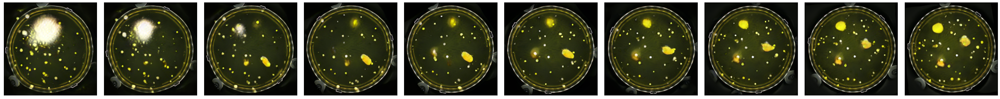

(10, 512)
Progress: 0 out of 10


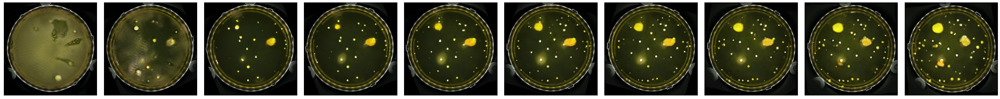

(10, 512)
Progress: 0 out of 10


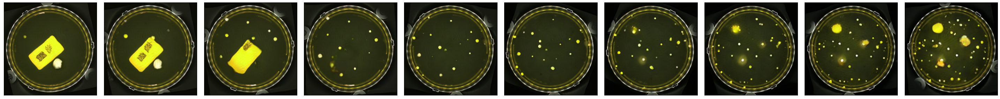

(10, 512)
Progress: 0 out of 10


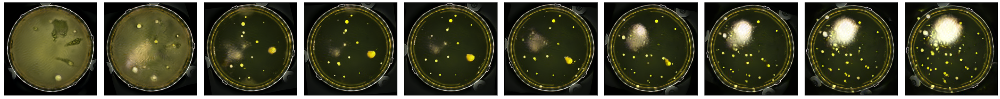

(10, 512)
Progress: 0 out of 10


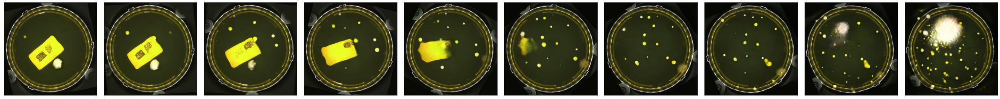

(10, 512)
Progress: 0 out of 10


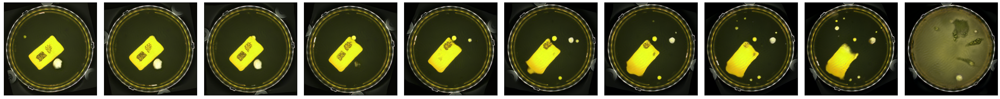

In [ ]:
#Interpolate between different images
explore_interpolations([farver[0],store[0]],ws,Gs,save_fig=  images_path+'interpolation_006046_farver_store.png')
explore_interpolations([farver[0],udsmurt[2]],ws,Gs,save_fig=images_path+'interpolation_006046_farver_udsmurt.png')
explore_interpolations([farver[0],labels[2]],ws,Gs,save_fig= images_path+'interpolation_006046_farver_labels.png')
explore_interpolations([store[0],udsmurt[2]],ws,Gs,save_fig= images_path+'interpolation_006046_store_udsmurt.png')
explore_interpolations([store[0],labels[2]],ws,Gs,save_fig=  images_path+'interpolation_006046_store_labels.png')
explore_interpolations([udsmurt[2],labels[2]],ws,Gs,save_fig=images_path+'interpolation_006046_udsmurt_labels.png')


## pickle 009917

In [ ]:
network_pkl = 'network-snapshot-009917'
network_path = f'/content/drive/My Drive/Thesis/stylegan2/network_pickles/{network_pkl}.pkl'
psi = 1.0

#Seeds of interest
udsmurt = ['C:/Users/lauri/Desktop/rare features generation/009917/image-46.jpg',
           'C:/Users/lauri/Desktop/rare features generation/009917/image-106.jpg',
           'C:/Users/lauri/Desktop/rare features generation/009917/image-263.jpg']

farver = ['C:/Users/lauri/Desktop/rare features generation/009917/image-448.jpg',
          'C:/Users/lauri/Desktop/rare features generation/009917/image-327.jpg',
          'C:/Users/lauri/Desktop/rare features generation/009917/image-133.jpg']

store = ['C:/Users/lauri/Desktop/rare features generation/009917/image-737.jpg',
         'C:/Users/lauri/Desktop/rare features generation/009917/image-504.jpg',
         'C:/Users/lauri/Desktop/rare features generation/009917/image-918.jpg']

labels = ['C:/Users/lauri/Desktop/rare features generation/009917/image-145.jpg',
          'C:/Users/lauri/Desktop/rare features generation/009917/image-368.jpg',
          'C:/Users/lauri/Desktop/rare features generation/009917/image-457.jpg']


udsmurt = [i.split('-')[-1].split('.')[0] for i in udsmurt]
farver = [i.split('-')[-1].split('.')[0] for i in farver]
store = [i.split('-')[-1].split('.')[0] for i in store]
labels = [i.split('-')[-1].split('.')[0] for i in labels]

In [ ]:
import os
import time
import glob
import pickle
import PIL.Image
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

%tensorflow_version 1.x
import tensorflow as tf
print(tf.__version__)
print(tf.test.gpu_device_name())

os.chdir('/content/drive/My Drive/Thesis/stylegan2/')
import dnnlib
import dnnlib.tflib as tflib
import pretrained_networks
print('Loading networks from "%s"...' % network_pkl)
_G, _D, Gs = pretrained_networks.load_networks(network_path)

#Load images
images_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/'
ys = pickle.load(open(images_path+'generated_images.pkl','rb'))
ws = pickle.load(open(images_path+'generated_ws.pkl','rb'))
ws = np.array(ws)[:,0,0] #[N_samples,w_length]

#Load PCA
#pca = pickle.load(open('/content/drive/My Drive/Thesis/PCA/pca_original_data_gray.pkl','rb'))


TensorFlow 1.x selected.
1.15.2
/device:GPU:0
Loading networks from "network-snapshot-009917"...
Setting up TensorFlow plugin "fused_bias_act.cu": Preprocessing... Loading... Done.
Setting up TensorFlow plugin "upfirdn_2d.cu": Preprocessing... Loading... Done.


### Double check that we have the right images

In [ ]:
for i in udsmurt[:3]:
  plt.imshow(ys[int(i)])
  plt.show()
for i in farver[:3]:
  plt.imshow(ys[int(i)])
  plt.show()
for i in store[:3]:
  plt.imshow(ys[int(i)])
  plt.show()
for i in labels[:3]:
  plt.imshow(ys[int(i)])
  plt.show()


### Interpolate!

In [ ]:
explore_interpolations(farver,ws)
explore_interpolations(store,ws)
explore_interpolations(udsmurt,ws)
explore_interpolations(labels,ws)

In [ ]:
#Interpolate between different images
#explore_interpolations([farver[0],store[2]],ws)
#explore_interpolations([farver[0],udsmurt[2]],ws)
#explore_interpolations([farver[0],labels[2]],ws)
#explore_interpolations([store[2],udsmurt[2]],ws)
#explore_interpolations([store[2],labels[2]],ws)
#explore_interpolations([udsmurt[2],labels[2]],ws)

#Interpolate between different images
explore_interpolations([farver[0],store[2]],ws,save_fig=  images_path+'interpolation_009917_farver_store.png')
explore_interpolations([farver[0],udsmurt[2]],ws,save_fig=images_path+'interpolation_009917_farver_udsmurt.png')
explore_interpolations([farver[0],labels[2]],ws,save_fig= images_path+'interpolation_009917_farver_labels.png')
explore_interpolations([store[2],udsmurt[2]],ws,save_fig= images_path+'interpolation_009917_store_udsmurt.png')
explore_interpolations([store[2],labels[2]],ws,save_fig=  images_path+'interpolation_009917_store_labels.png')
explore_interpolations([udsmurt[2],labels[2]],ws,save_fig=images_path+'interpolation_009917_udsmurt_labels.png')



## Pickle 11368

In [ ]:
network_pkl = 'network-snapshot-011368'
network_path = f'/content/drive/My Drive/Thesis/stylegan2/network_pickles/{network_pkl}.pkl'
psi = 1.0

#Seeds of interest
udsmurt = ['C:/Users/lauri/Desktop/rare features generation/011368/image-35.jpg',
           'C:/Users/lauri/Desktop/rare features generation/011368/image-37.jpg',
           'C:/Users/lauri/Desktop/rare features generation/011368/image-473.jpg']

farver = ['C:/Users/lauri/Desktop/rare features generation/011368/image-133.jpg',
          'C:/Users/lauri/Desktop/rare features generation/011368/image-327.jpg',
          'C:/Users/lauri/Desktop/rare features generation/011368/image-448.jpg']

store = ['C:/Users/lauri/Desktop/rare features generation/011368/image-657.jpg',
         'C:/Users/lauri/Desktop/rare features generation/011368/image-1031.jpg',
         'C:/Users/lauri/Desktop/rare features generation/011368/image-253.jpg']

labels = ['C:/Users/lauri/Desktop/rare features generation/011368/image-335.jpg',
          'C:/Users/lauri/Desktop/rare features generation/011368/image-488.jpg',
          'C:/Users/lauri/Desktop/rare features generation/011368/image-662.jpg']


udsmurt = [i.split('-')[-1].split('.')[0] for i in udsmurt]
farver = [i.split('-')[-1].split('.')[0] for i in farver]
store = [i.split('-')[-1].split('.')[0] for i in store]
labels = [i.split('-')[-1].split('.')[0] for i in labels]

In [ ]:
import os
import time
import glob
import pickle
import PIL.Image
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

%tensorflow_version 1.x
import tensorflow as tf
print(tf.__version__)
print(tf.test.gpu_device_name())

os.chdir('/content/drive/My Drive/Thesis/stylegan2/')
import dnnlib
import dnnlib.tflib as tflib
import pretrained_networks
print('Loading networks from "%s"...' % network_pkl)
_G, _D, Gs = pretrained_networks.load_networks(network_path)

#Load images
images_path = f'/content/drive/My Drive/Thesis/generated_images/{network_pkl}/truncation_{psi}/'
ys = pickle.load(open(images_path+'generated_images.pkl','rb'))
ws = pickle.load(open(images_path+'generated_ws.pkl','rb'))
ws = np.array(ws)[:,0,0] #[N_samples,w_length]

#Load PCA
pca = pickle.load(open('/content/drive/My Drive/Thesis/PCA/pca_original_data_gray.pkl','rb'))


1.15.2
/device:GPU:0
Loading networks from "network-snapshot-011368"...


/usr/local/lib/python3.6/dist-packages/sklearn/base.py:318: UserWarning: Trying to unpickle estimator PCA from version 0.22.1 when using version 0.22.2.post1. This might lead to breaking code or invalid results. Use at your own risk.
  UserWarning)


### Double check we have the right images

In [ ]:
for i in udsmurt[:3]:
  plt.imshow(ys[int(i)])
  plt.show()
for i in farver[:3]:
  plt.imshow(ys[int(i)])
  plt.show()
for i in store[:3]:
  plt.imshow(ys[int(i)])
  plt.show()
for i in labels[:3]:
  plt.imshow(ys[int(i)])
  plt.show()


### Interpolate!

In [ ]:
#Interpolate between similar images
explore_interpolations(farver,ws)
explore_interpolations(store,ws)
explore_interpolations(udsmurt,ws)
explore_interpolations(labels,ws)

(10, 512)
Progress: 0 out of 10


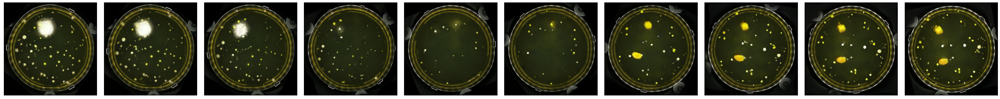

(10, 512)
Progress: 0 out of 10


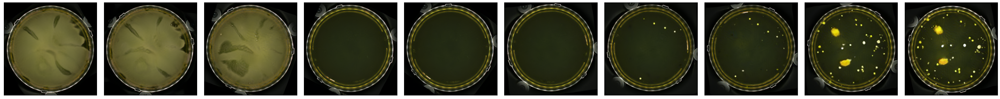

(10, 512)
Progress: 0 out of 10


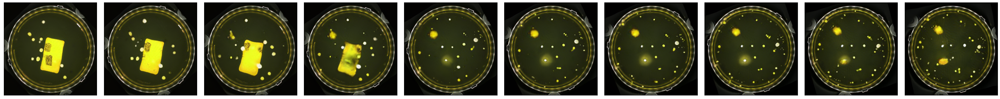

(10, 512)
Progress: 0 out of 10


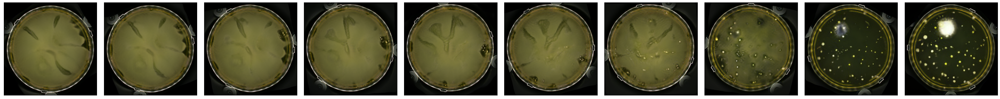

(10, 512)
Progress: 0 out of 10


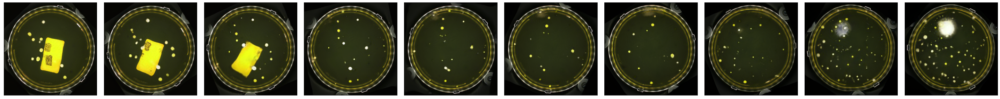

(10, 512)
Progress: 0 out of 10


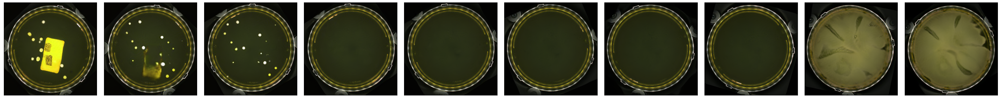

In [ ]:
#Interpolate between different images
#explore_interpolations([farver[0],store[2]],ws)
#explore_interpolations([farver[0],udsmurt[0]],ws)
#explore_interpolations([farver[0],labels[2]],ws)
#explore_interpolations([store[2],udsmurt[2]],ws)
#explore_interpolations([store[0],labels[0]],ws)
#explore_interpolations([udsmurt[0],labels[0]],ws)


#Interpolate between different images
explore_interpolations([farver[0],store[0]],ws,save_fig=  images_path+'interpolation_011368_farver_store.png')
explore_interpolations([farver[0],udsmurt[0]],ws,save_fig=images_path+'interpolation_011368_farver_udsmurt.png')
explore_interpolations([farver[0],labels[0]],ws,save_fig= images_path+'interpolation_011368_farver_labels.png')
explore_interpolations([store[0],udsmurt[0]],ws,save_fig= images_path+'interpolation_011368_store_udsmurt.png')
explore_interpolations([store[0],labels[0]],ws,save_fig=  images_path+'interpolation_011368_store_labels.png')
explore_interpolations([udsmurt[0],labels[0]],ws,save_fig=images_path+'interpolation_011368_udsmurt_labels.png')

